<a href="https://colab.research.google.com/github/hmezer/dai-project/blob/main/prediction_with_sentiment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Initial Setup

In [1]:
!git clone https://github.com/hmezer/dai-project

Cloning into 'dai-project'...
remote: Enumerating objects: 223, done.
remote: Counting objects: 100% (73/73), done.
remote: Compressing objects: 100% (69/69), done.
remote: Total 223 (delta 32), reused 4 (delta 4), pack-reused 150 (from 1)
Receiving objects: 100% (223/223), 125.49 MiB | 20.47 MiB/s, done.
Resolving deltas: 100% (99/99), done.


In [2]:
# extract the zip content at dai-project/data/nasdaq-sentiment.zip
!unzip -o dai-project/data/sp500-daily/sp500_chunk_1.zip -d dai-project/data/sp500-daily-csv/
!unzip -o dai-project/data/sp500-daily/sp500_chunk_2.zip -d dai-project/data/sp500-daily-csv/
!unzip -o dai-project/data/sp500-daily/sp500_chunk_3.zip -d dai-project/data/sp500-daily-csv/
!unzip -o dai-project/data/sp500-daily/sp500_chunk_4.zip -d dai-project/data/sp500-daily-csv/

Archive:  dai-project/data/sp500-daily/sp500_chunk_1.zip
  inflating: dai-project/data/sp500-daily-csv/sp500_batch_14.csv  
  inflating: dai-project/data/sp500-daily-csv/sp500_batch_6.csv  
  inflating: dai-project/data/sp500-daily-csv/sp500_batch_18.csv  
  inflating: dai-project/data/sp500-daily-csv/sp500_batch_4.csv  
  inflating: dai-project/data/sp500-daily-csv/sp500_batch_20.csv  
Archive:  dai-project/data/sp500-daily/sp500_chunk_2.zip
  inflating: dai-project/data/sp500-daily-csv/sp500_batch_10.csv  
  inflating: dai-project/data/sp500-daily-csv/sp500_batch_19.csv  
  inflating: dai-project/data/sp500-daily-csv/sp500_batch_11.csv  
  inflating: dai-project/data/sp500-daily-csv/sp500_batch_12.csv  
  inflating: dai-project/data/sp500-daily-csv/sp500_batch_17.csv  
Archive:  dai-project/data/sp500-daily/sp500_chunk_3.zip
  inflating: dai-project/data/sp500-daily-csv/sp500_batch_8.csv  
  inflating: dai-project/data/sp500-daily-csv/sp500_batch_5.csv  
  inflating: dai-project/data

In [3]:
# extract the zip content at dai-project/data/nasdaq-sentiment.zip
!unzip -o dai-project/data/nasdaq-sentiment.zip -d dai-project/data/nasdaq-sentiment/

Archive:  dai-project/data/nasdaq-sentiment.zip
 extracting: dai-project/data/nasdaq-sentiment/chunk_3_batch_23.jsonl  
 extracting: dai-project/data/nasdaq-sentiment/chunk_3_batch_26.jsonl  
 extracting: dai-project/data/nasdaq-sentiment/chunk_4_batch_16.jsonl  
 extracting: dai-project/data/nasdaq-sentiment/chunk_2_batch_91.jsonl  
 extracting: dai-project/data/nasdaq-sentiment/chunk_2_batch_173.jsonl  
 extracting: dai-project/data/nasdaq-sentiment/chunk_2_batch_20.jsonl  
 extracting: dai-project/data/nasdaq-sentiment/chunk_1_batch_43.jsonl  
 extracting: dai-project/data/nasdaq-sentiment/chunk_4_batch_109.jsonl  
 extracting: dai-project/data/nasdaq-sentiment/chunk_3_batch_41.jsonl  
 extracting: dai-project/data/nasdaq-sentiment/chunk_1_batch_30.jsonl  
 extracting: dai-project/data/nasdaq-sentiment/chunk_3_batch_35.jsonl  
 extracting: dai-project/data/nasdaq-sentiment/chunk_1_batch_67.jsonl  
 extracting: dai-project/data/nasdaq-sentiment/chunk_3_batch_116.jsonl  
 extracting: 

# Explanatory Data Analysis

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow import keras
import seaborn as sns
import os
from datetime import datetime
import glob

import warnings
warnings.filterwarnings("ignore")

In [5]:
# Define the directory containing the CSV files
csv_directory = 'dai-project/data/sp500-daily-csv/'

# Get a list of all CSV files in the directory
csv_files = glob.glob(csv_directory + '*.csv')

# Create an empty list to store dataframes
dfs = []

# Loop through the files and read them into dataframes
for file in csv_files:
    df = pd.read_csv(file)
    dfs.append(df)

# Concatenate all dataframes into a single dataframe
df = pd.concat(dfs, ignore_index=True)

# Print the shape and display the head of the combined dataframe
print(df.info())
display(df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1997825 entries, 0 to 1997824
Data columns (total 12 columns):
 #   Column          Dtype  
---  ------          -----  
 0   Date            int64  
 1   Ticker          object 
 2   Open            float64
 3   High            float64
 4   Low             float64
 5   Close           float64
 6   Volume          int64  
 7   OpenAdjusted    float64
 8   HighAdjusted    float64
 9   LowAdjusted     float64
 10  CloseAdjusted   float64
 11  VolumeAdjusted  int64  
dtypes: float64(8), int64(3), object(1)
memory usage: 182.9+ MB
None


,Date,Ticker,Open,High,Low,Close,Volume,OpenAdjusted,HighAdjusted,LowAdjusted,CloseAdjusted,VolumeAdjusted
0,20120921,CCI,65.27,66.11,65.22,65.38,2831238,64.3689,65.1973,64.3196,64.4774,2831238
1,20120919,CCI,64.22,65.00,64.08,64.89,1218167,63.3334,64.1026,63.1953,63.9941,1218167
2,20120924,CCI,64.46,64.73,63.82,63.96,2440235,63.5701,63.8364,62.9389,63.0770,2440235
3,20120925,CCI,64.10,64.59,63.64,63.64,977838,63.2151,63.6983,62.7614,62.7614,977838
4,20120928,CCI,65.02,65.43,64.00,64.09,2454034,64.1224,64.5267,63.1164,63.2052,2454034


In [6]:
df['Date'] = pd.to_datetime(df['Date'], format='%Y%m%d')
print(df.info(), "\n")
print(df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1997825 entries, 0 to 1997824
Data columns (total 12 columns):
 #   Column          Dtype         
---  ------          -----         
 0   Date            datetime64[ns]
 1   Ticker          object        
 2   Open            float64       
 3   High            float64       
 4   Low             float64       
 5   Close           float64       
 6   Volume          int64         
 7   OpenAdjusted    float64       
 8   HighAdjusted    float64       
 9   LowAdjusted     float64       
 10  CloseAdjusted   float64       
 11  VolumeAdjusted  int64         
dtypes: datetime64[ns](1), float64(8), int64(2), object(1)
memory usage: 182.9+ MB
None 

        Date Ticker   Open   High    Low  Close   Volume  OpenAdjusted  \
0 2012-09-21    CCI  65.27  66.11  65.22  65.38  2831238       64.3689   
1 2012-09-19    CCI  64.22  65.00  64.08  64.89  1218167       63.3334   
2 2012-09-24    CCI  64.46  64.73  63.82  63.96  2440235       63.5701 

#### Stock Price and Volume Trends for Selected Companies (2022)

This section visualizes the daily open, close, and volume data for key tech and retail companies in 2022.

- **First row:** Each subplot compares the adjusted opening (green) and closing (red) prices for a given company, highlighting short-term price movements and trends.
- **Second row:** The subplots display daily adjusted trading volume (purple), revealing spikes on active trading days.

These plots provide a quick overview of how stock prices and trading activity evolved over the year, helping us spot volatility, trends, and significant events for each company.

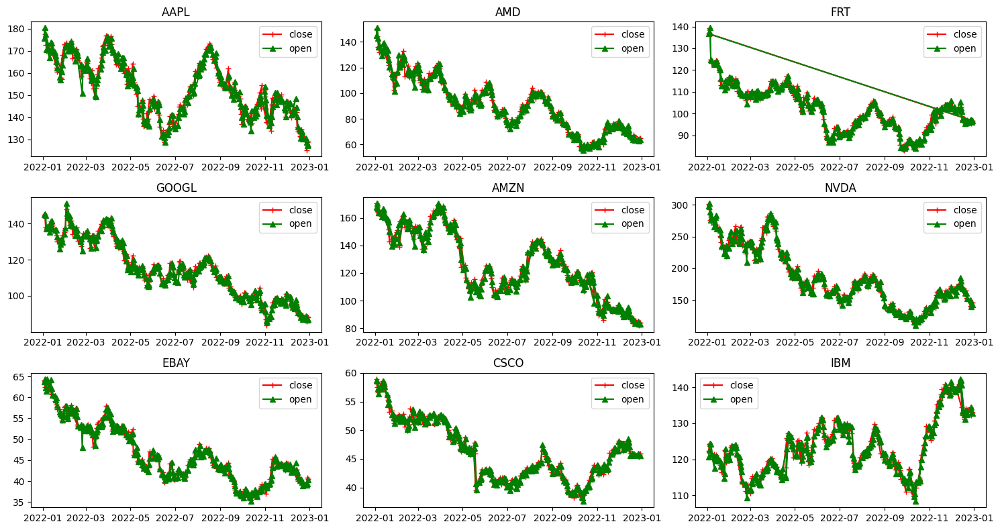

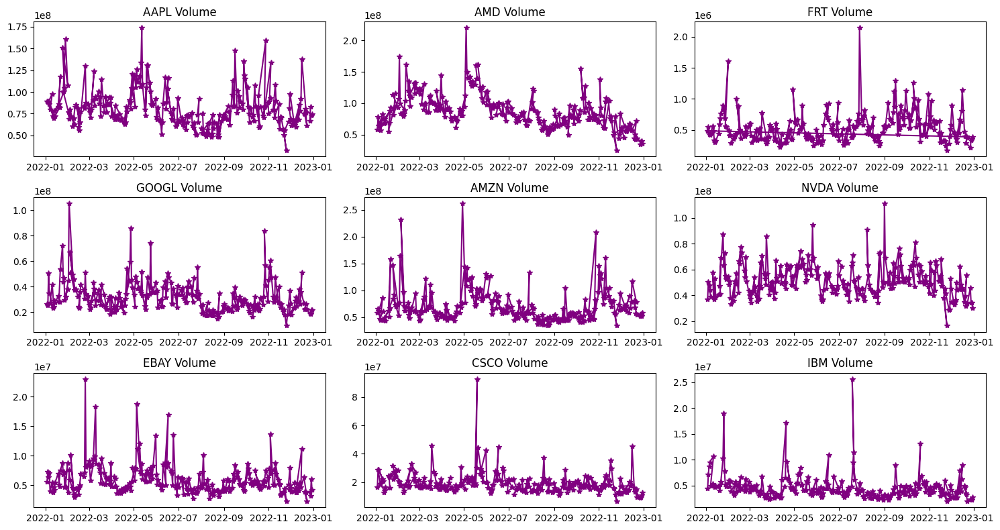

In [7]:
companies = ['AAPL', 'AMD', 'FRT', 'GOOGL', 'AMZN', 'NVDA', 'EBAY', 'CSCO', 'IBM']

plt.figure(figsize=(15, 8))
for index, company in enumerate(companies, 1):
    plt.subplot(3, 3, index)
    c = df[df['Ticker'] == company].set_index('Date').loc['2022'].reset_index() # Filter for the year 2022
    plt.plot(c['Date'], c['CloseAdjusted'], c="r", label="close", marker="+")
    plt.plot(c['Date'], c['OpenAdjusted'], c="g", label="open", marker="^")
    plt.title(company)
    plt.legend()
    plt.tight_layout()

plt.figure(figsize=(15, 8))
for index, company in enumerate(companies, 1):
    plt.subplot(3, 3, index)
    c = df[df['Ticker'] == company].set_index('Date').loc['2022'].reset_index() # Filter for the year 2022
    plt.plot(c['Date'], c['VolumeAdjusted'], c='purple', marker='*')
    plt.title(f"{company} Volume")
    plt.tight_layout()

# Feature Engineering

##Future & Past Return Indicators for Stock Prediction

To enhance our predictive models, this section systematically augments the dataset with a comprehensive set of return-based features for each stock. These engineered features provide crucial signals about both **future** and **past** market behavior, helping models learn patterns not just from historical data, but also from how prices and volatility are expected to evolve.

### What This Code Does

1. **Return Features:**  
   - Calculates both logarithmic and compounded returns for 1-day, 1-week, and 1-month horizons.
   - Adds both future-looking returns (e.g., "what will the return be in 5 days?") and past-looking returns (e.g., "what was the return over the last 5 days?").

2. **Volatility, Momentum, Drawdown, and Max Gain:**  
   - Quantifies expected and realized price volatility, momentum (average return), drawdown (max loss), and max gain for both future and past periods.
   - These metrics are vital for capturing risk and trend information.

3. **Directionality:**  
   - Adds binary indicators for whether price moved up or down over each horizon, for both the future (supervised labels) and the past (features).

4. **Per-Ticker Grouping:**  
   - Applies all calculations separately for each stock, preserving time order, ensuring accurate rolling window metrics.
   - Concatenates all processed data for downstream modeling.

### Why These Features Matter

- **Future features** like returns, volatility, and direction serve as targets for supervised learning models.
- **Past features** are input signals for the model, capturing historical context and patterns that might inform future movements.
- Rolling windows (weekly/monthly) help the model recognize persistent trends and cycles.
- By engineering both cumulative (total change) and compounded (growth rate) metrics, the dataset becomes rich enough to support regression, classification, and even risk modeling tasks.

### How to Use

After running this cell, your dataframe (`df_features`) will contain, for each date and ticker:
- Past and future return metrics
- Volatility and momentum indicators
- Drawdown and max gain signals
- Binary price direction targets

This expanded feature set sets the stage for robust machine learning experiments, allowing you to investigate which signals best predict stock price movements.

In [7]:
import numpy as np
import pandas as pd

def add_return_features(df):
    # --- Your features ---
    df['future_1D_Return_log'] = np.log1p(df['CloseAdjusted'].pct_change(periods=-1) * -1)
    df['future_1W_Return_CUML_log'] = np.log1p(df['CloseAdjusted'].pct_change(periods=-5) * -1)
    df['future_1M_Return_CUML_log'] = np.log1p(df['CloseAdjusted'].pct_change(periods=-20) * -1)
    df['future_1W_Return_COMP_log'] = np.log1p((1 + df['future_1D_Return_log']).rolling(window=5).apply(np.prod, raw=True).shift(-5) - 1)
    df['future_1M_Return_COMP_log'] = np.log1p((1 + df['future_1D_Return_log']).rolling(window=20).apply(np.prod, raw=True).shift(-20) - 1)

    # --- Past returns ---
    df['past_1D_Return_log'] = np.log1p(df['CloseAdjusted'].pct_change(periods=1))
    df['past_1W_Return_CUML_log'] = np.log1p(df['CloseAdjusted'].pct_change(periods=5))
    df['past_1M_Return_CUML_log'] = np.log1p(df['CloseAdjusted'].pct_change(periods=20))
    df['past_1W_Return_COMP_log'] = np.log1p((1 + df['past_1D_Return_log']).rolling(window=5).apply(np.prod, raw=True) - 1)
    df['past_1M_Return_COMP_log'] = np.log1p((1 + df['past_1D_Return_log']).rolling(window=20).apply(np.prod, raw=True) - 1)

    # =============================
    # --- Additional future indicators ---
    # =============================

    # Future volatility (realized volatility over next period)
    df['future_1W_volatility'] = df['CloseAdjusted'].pct_change(periods=-1).rolling(window=5).std().shift(-5)
    df['future_1M_volatility'] = df['CloseAdjusted'].pct_change(periods=-1).rolling(window=20).std().shift(-20)

    # Future momentum (mean return over window)
    df['future_1W_momentum'] = df['CloseAdjusted'].pct_change(periods=-1).rolling(window=5).mean().shift(-5)
    df['future_1M_momentum'] = df['CloseAdjusted'].pct_change(periods=-1).rolling(window=20).mean().shift(-20)

    # Future drawdown (max loss in next period)
    df['future_1W_drawdown'] = (df['CloseAdjusted'].shift(-5) - df['CloseAdjusted']) / df['CloseAdjusted']
    df['future_1M_drawdown'] = (df['CloseAdjusted'].shift(-20) - df['CloseAdjusted']) / df['CloseAdjusted']

    # Future max gain (max gain in next period)
    df['future_1W_max_gain'] = (df['CloseAdjusted'].rolling(window=5).max().shift(-5) - df['CloseAdjusted']) / df['CloseAdjusted']
    df['future_1M_max_gain'] = (df['CloseAdjusted'].rolling(window=20).max().shift(-20) - df['CloseAdjusted']) / df['CloseAdjusted']

    # Future price direction (binary up/down for each horizon)
    df['future_1D_direction'] = (df['future_1D_Return_log'] > 0).astype(int)
    df['future_1W_direction'] = (df['future_1W_Return_CUML_log'] > 0).astype(int)
    df['future_1M_direction'] = (df['future_1M_Return_CUML_log'] > 0).astype(int)

    # =============================
    # --- Additional past indicators (NEW) ---
    # =============================

    # Past volatility (realized volatility over previous period)
    df['past_1W_volatility'] = df['CloseAdjusted'].pct_change(periods=1).rolling(window=5).std()
    df['past_1M_volatility'] = df['CloseAdjusted'].pct_change(periods=1).rolling(window=20).std()

    # Past momentum (mean return over previous window)
    df['past_1W_momentum'] = df['CloseAdjusted'].pct_change(periods=1).rolling(window=5).mean()
    df['past_1M_momentum'] = df['CloseAdjusted'].pct_change(periods=1).rolling(window=20).mean()

    # Past drawdown (max loss in previous period)
    df['past_1W_drawdown'] = (df['CloseAdjusted'] - df['CloseAdjusted'].rolling(window=5).min()) / df['CloseAdjusted']
    df['past_1M_drawdown'] = (df['CloseAdjusted'] - df['CloseAdjusted'].rolling(window=20).min()) / df['CloseAdjusted']

    # Past max gain (max gain in previous period)
    df['past_1W_max_gain'] = (df['CloseAdjusted'].rolling(window=5).max() - df['CloseAdjusted']) / df['CloseAdjusted']
    df['past_1M_max_gain'] = (df['CloseAdjusted'].rolling(window=20).max() - df['CloseAdjusted']) / df['CloseAdjusted']

    # Past price direction (binary up/down for each horizon)
    df['past_1D_direction'] = (df['past_1D_Return_log'] > 0).astype(int)
    df['past_1W_direction'] = (df['past_1W_Return_CUML_log'] > 0).astype(int)
    df['past_1M_direction'] = (df['past_1M_Return_CUML_log'] > 0).astype(int)

    return df

# List to hold processed DataFrames
dfs = []

for ticker, group in df.groupby('Ticker'):
    print(f"Processing {ticker}...")
    group = group.sort_values(by='Date')
    group_processed = add_return_features(group.copy())
    dfs.append(group_processed)

# Concatenate all processed groups
df_features = pd.concat(dfs, ignore_index=True)

print(df_features.shape)
display(df_features.head())

Processing A...
Processing AAPL...
Processing ABBV...
Processing ABNB...
Processing ABT...
Processing ACGL...
Processing ACN...
Processing ADBE...
Processing ADI...
Processing ADM...
Processing ADP...
Processing ADSK...
Processing AEE...
Processing AEP...
Processing AES...
Processing AFL...
Processing AIG...
Processing AIZ...
Processing AJG...
Processing AKAM...
Processing ALB...
Processing ALGN...
Processing ALL...
Processing ALLE...
Processing AMAT...
Processing AMCR...
Processing AMD...
Processing AME...
Processing AMGN...
Processing AMP...
Processing AMT...
Processing AMZN...
Processing ANET...
Processing AON...
Processing AOS...
Processing APA...
Processing APD...
Processing APH...
Processing APO...
Processing APTV...
Processing ARE...
Processing ATO...
Processing AVB...
Processing AVGO...
Processing AVY...
Processing AWK...
Processing AXON...
Processing AXP...
Processing AZO...
Processing BA...
Processing BAC...
Processing BALL...
Processing BAX...
Processing BBY...
Processing BD

,Date,Ticker,Open,High,Low,Close,Volume,OpenAdjusted,HighAdjusted,LowAdjusted,...,past_1M_volatility,past_1W_momentum,past_1M_momentum,past_1W_drawdown,past_1M_drawdown,past_1W_max_gain,past_1M_max_gain,past_1D_direction,past_1W_direction,past_1M_direction
0,2007-01-03,A,34.53,35.48,34.05,34.29,1274200,22.4782,23.0966,22.1657,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
1,2007-01-04,A,34.12,34.60,33.46,34.44,835000,22.2113,22.5237,21.7816,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0
2,2007-01-05,A,34.14,34.40,34.01,34.09,1324100,22.2243,22.3935,22.1397,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
3,2007-01-08,A,33.98,34.08,33.68,34.00,735300,22.1201,22.1852,21.9248,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0
4,2007-01-09,A,34.08,34.32,33.63,34.03,541500,22.1852,22.3415,21.8923,...,NaN,NaN,NaN,0.00088,NaN,0.012048,NaN,1,0,0


In [8]:
print(df_features.shape)
df_features.replace([np.inf, -np.inf], np.nan, inplace=True)
# now drop the rows with nan values
df_features.dropna(inplace=True)
print(df_features.shape)

(1997825, 44)
(1973450, 44)


## Explanation of Sentiment Metrics: Diluted, Pure, and Immediate

The imported sentiment dataset offers three distinct polarity scores for each press release and company, each capturing a different facet of textual sentiment:

- **Polarity_diluted**  
  This metric "dilutes" the overall sentiment by spreading the polarity across all sentences in the press release, including neutral and off-topic sentences. If a release is long or contains many neutral statements, the diluted score will tend toward zero, even if some sentences are strongly positive or negative. This measure helps capture the overall tone with respect to the amount of content.

- **Polarity_pure**  
  The pure score focuses only on "polar" sentences — those that are clearly positive or negative — and ignores neutral sentences entirely. It averages the sentiment of these polarized sentences, providing a more focused and potentially more volatile signal that highlights strong opinions or reactions, without being diluted by neutral context.

- **Polarity_immediate**  
  This metric is the most targeted: it averages the sentiment of only those sentences where the company (`Ticker`) is explicitly mentioned. This score reflects sentiment that is specifically and directly attributed to the company, making it particularly relevant for short-term prediction or event-driven analysis.

Together, these metrics allow for nuanced sentiment analysis:
- **Diluted** captures broad tone and context,
- **Pure** highlights strong opinions,
- **Immediate** isolates direct mentions and impacts.
By analyzing all three, you can better model how news and press releases may influence stock behavior for each company.

In [9]:
# import the *.jsonl objects from the directory
import glob
import json
import pandas as pd

dir = "dai-project/data/nasdaq-sentiment/"
files = glob.glob(dir + "*.jsonl")
dfs = []
for file in files:
    df_ = pd.read_json(file, lines=True)
    dfs.append(df_)
df_sentiment = pd.concat(dfs).reset_index(drop=True)

# Change column names to have uppercase first character
df_sentiment.columns = [col.capitalize() for col in df_sentiment.columns]

print(df_sentiment.shape, "\n")
print(df_sentiment.head(), "\n")
print(df_sentiment.info(), "\n")

(94388, 5) 

  Ticker       Date  Polarity_diluted  Polarity_pure  Polarity_immediate
0   CTSH 2004-12-23          0.410244       0.820488                   1
1   TRAC 2004-12-23          0.137843       0.964898                   0
2     AX 2004-12-23          0.137843       0.964898                   0
3   INGP 2004-12-23          0.137843       0.964898                   0
4   NDAQ 2004-12-23          0.137843       0.964898                   0 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 94388 entries, 0 to 94387
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Ticker              94388 non-null  object        
 1   Date                94388 non-null  datetime64[ns]
 2   Polarity_diluted    94388 non-null  float64       
 3   Polarity_pure       94388 non-null  float64       
 4   Polarity_immediate  94388 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(1)

In [10]:
df_sentiment = df_sentiment.groupby(['Date', 'Ticker'])[['Polarity_diluted', 'Polarity_pure', 'Polarity_immediate']].mean().reset_index()
print(df_sentiment.shape)
df_sentiment.head()

(80988, 5)


,Date,Ticker,Polarity_diluted,Polarity_pure,Polarity_immediate
0,2001-01-30,FFIV,0.277618,0.485831,0.0
1,2002-10-17,ADI,0.376470,0.990711,0.0
2,2002-10-17,AKAM,0.376470,0.990711,0.0
3,2002-10-17,ASPM,0.376470,0.990711,0.0
4,2002-10-17,CTRA,0.376470,0.990711,0.0


We merge the datasets containing `features` and `polarities`, which reduces the size of the dataset where we have no column `NaN`.

In [11]:
df_merged = (pd.merge(
        df_features,
        df_sentiment,
        on=['Date', 'Ticker'],
        how='inner' # Keeps only the rows where `Date` exists in both
    )
    .sort_values(by='Date')
    .drop(columns=['Ticker']))

# Display the head of the merged dataframe
print(df_merged.shape, "\n")
print(df_merged.head(), "\n")
print(df_merged.info())

(43030, 46) 

            Date   Open     High    Low  Close    Volume  OpenAdjusted  \
22293 2007-02-01  98.97  99.1800  97.96  99.00   3395900       54.7297   
32523 2007-02-01  17.22  17.3400  17.03  17.04  28314541       14.0578   
3829  2007-02-01  37.95  39.3000  37.85  38.70  14444068        1.8975   
23006 2007-02-01  20.98  21.1400  20.87  21.10  47253855       12.6759   
29734 2007-02-01  22.69  23.1001  22.65  22.74   1041583        3.2414   

       HighAdjusted  LowAdjusted  CloseAdjusted  ...  past_1W_drawdown  \
22293       54.8458      54.1712        54.7463  ...          0.016061   
32523       14.1557      13.9027        13.9108  ...          0.000000   
3829         1.9650       1.8925         1.9350  ...          0.048579   
23006       12.7726      12.6094        12.7484  ...          0.026537   
29734        3.3000       3.2357         3.2486  ...          0.007049   

       past_1M_drawdown  past_1W_max_gain  past_1M_max_gain  \
22293          0.028687          

Optionally, save the dataset with polarities.

In [ ]:
# !!!
# OPTIONAL
# !!!
chunk_size = 25000
num_chunks = len(df_merged) // chunk_size + (1 if len(df_merged) % chunk_size != 0 else 0)

for i in range(num_chunks):
    start_row = i * chunk_size
    end_row = (i + 1) * chunk_size
    df_chunk = df_merged.iloc[start_row:end_row]
    df_chunk.to_csv(f'stock_with_features_polarities_chunk_{i+1}.csv', index=False)

print(f"DataFrame split into {num_chunks} chunks and saved.")

DataFrame split into 2 chunks and saved.


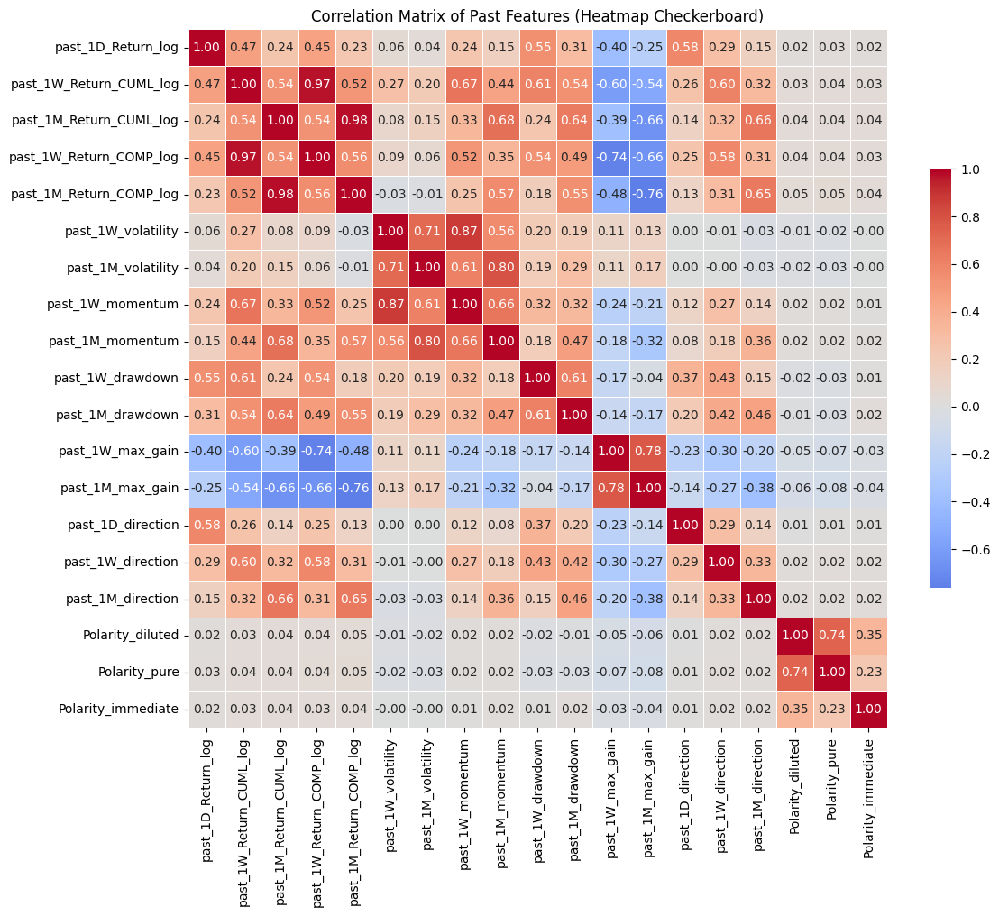

In [13]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming your DataFrame is df_merged and past_features are already defined
past_features = [col for col in df_merged.columns if col.startswith('past_') or 'Polarity' in col]
corr_matrix = df_merged[past_features].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(
    corr_matrix,
    annot=True,             # Show numeric values
    fmt=".2f",              # Format for numbers
    cmap="coolwarm",        # Heatmap color scheme (blue=negative, red=positive)
    center=0,               # Center at zero correlation
    square=True,            # Checkerboard style
    linewidths=.5,          # Lines between squares
    cbar_kws={'shrink': .6} # Smaller colorbar
)
plt.title("Correlation Matrix of Past Features (Heatmap Checkerboard)")
plt.tight_layout()
plt.show()

We also check the correlation between the `Polarities` against the `Future` columns.

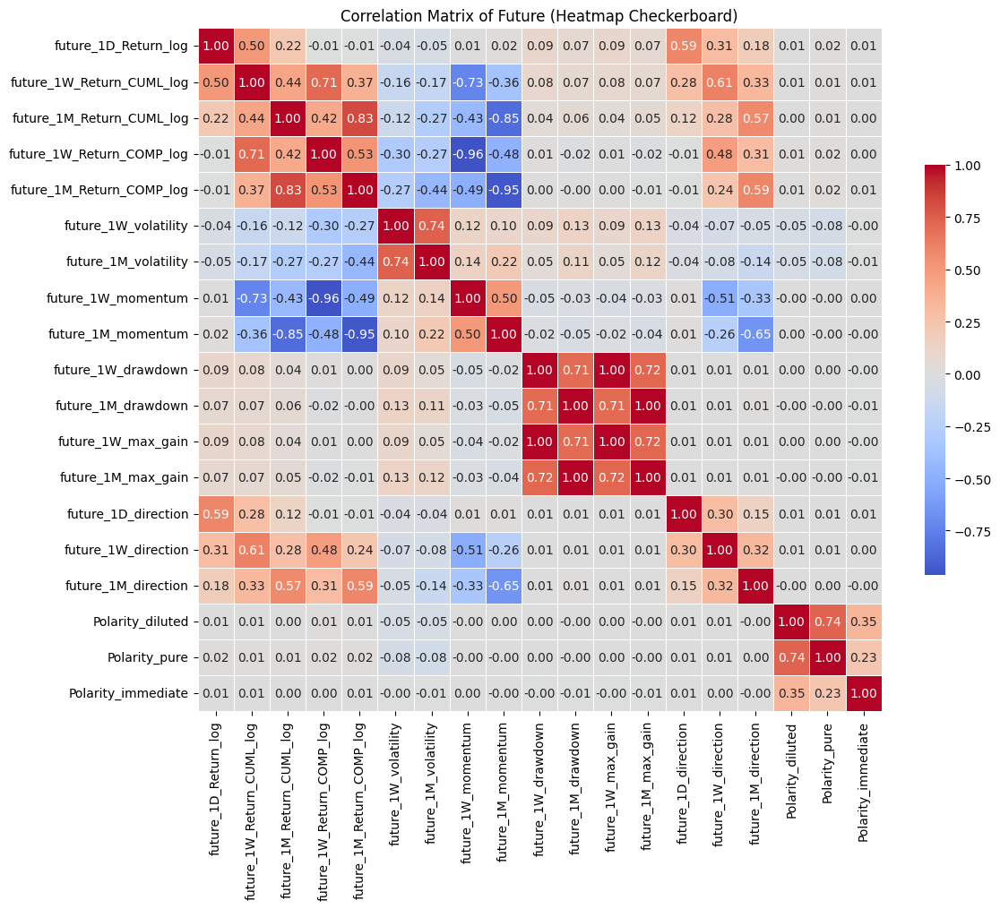

In [14]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming your DataFrame is df_merged and past_features are already defined
future_features = [col for col in df_merged.columns if col.startswith('future_') or 'Polarity' in col]
corr_matrix = df_merged[future_features].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(
    corr_matrix,
    annot=True,             # Show numeric values
    fmt=".2f",              # Format for numbers
    cmap="coolwarm",        # Heatmap color scheme (blue=negative, red=positive)
    center=0,               # Center at zero correlation
    square=True,            # Checkerboard style
    linewidths=.5,          # Lines between squares
    cbar_kws={'shrink': .6} # Smaller colorbar
)
plt.title("Correlation Matrix of Future (Heatmap Checkerboard)")
plt.tight_layout()
plt.show()

`Polarity` columns seem to have no particular linear relationship between both `past` and `future` columns, which may indicate strong relevance in the prediction setup, or a complete noise, which we will question later.

Next, we scale the features into a *uniform scale* to check the scatter pair plots.

In [15]:
from sklearn.preprocessing import QuantileTransformer

qt = QuantileTransformer(output_distribution='uniform')

# Example: Transforming polarity and return columns in your df
cols_to_transform = [
    col for col in df_merged.columns if df_merged[col].dtype in ['float64', 'int64']
]

df_transformed = df_merged.copy()
df_transformed[cols_to_transform] = qt.fit_transform(df_transformed[cols_to_transform])

## Pairwise Visualization of Feature Relationships

This code uses Seaborn’s `PairGrid` to create a matrix of plots that visually explore the relationships between key features in the dataset, including volume, past and future returns, volatility, drawdown, direction, and several sentiment scores.

- **Diagonal subplots:**  
  Show histograms of each feature, giving a sense of their distributions.

- **Off-diagonal subplots:**  
  Show scatter plots, revealing how two variables interact.

- **Color coding:**  
  - Red: Compares past and future features (e.g., past vs. future returns or volatility).
  - Purple: Involves sentiment features (`Polarity_diluted`, `Polarity_pure`, `Polarity_immediate`).
  - Blue: Other combinations.

By scanning this grid, you can quickly spot correlations, clusters, or outliers between pairs of features, and see how sentiment variables relate to market variables. This helps guide feature selection and model design for prediction tasks.

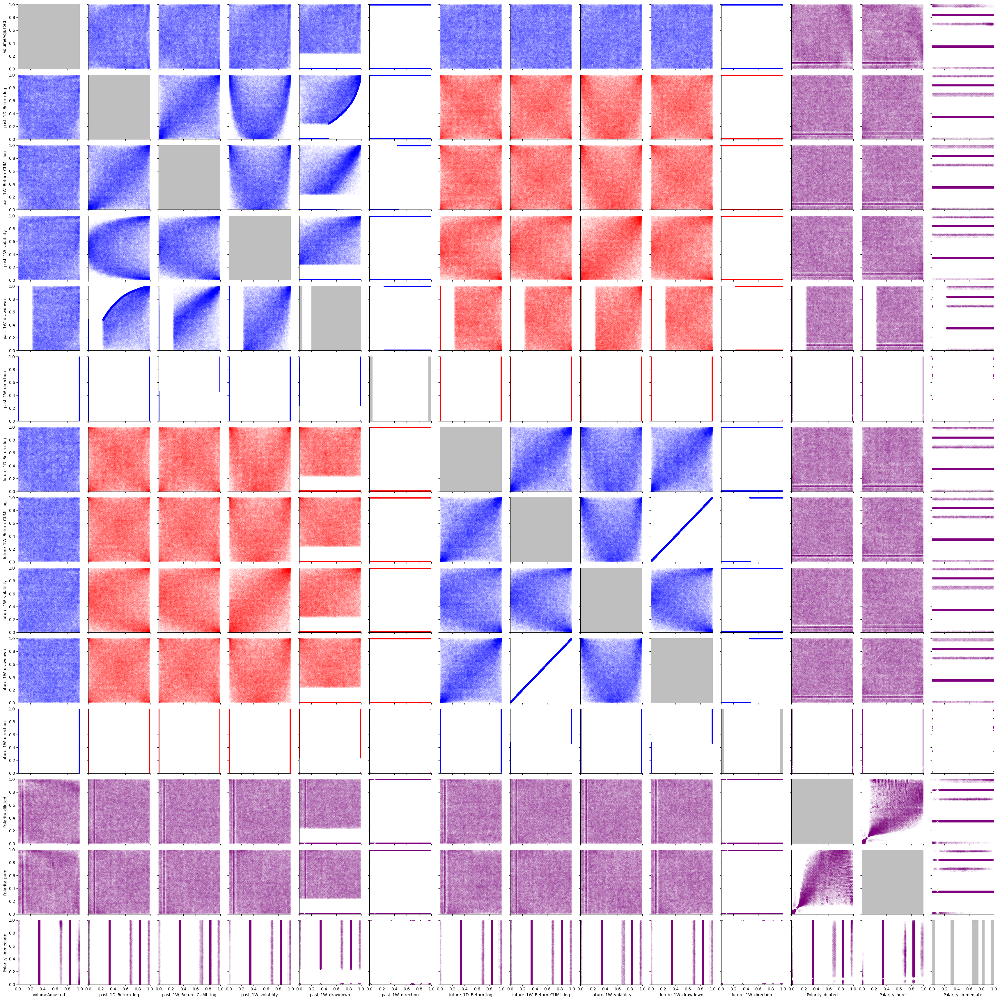

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

cols = [
    'VolumeAdjusted',
    'past_1D_Return_log',
    'past_1W_Return_CUML_log',
    'past_1W_volatility',
    'past_1W_drawdown',
    'past_1W_direction',
    'future_1D_Return_log',
    'future_1W_Return_CUML_log',
    'future_1W_volatility',
    'future_1W_drawdown',
    'future_1W_direction',
    'Polarity_diluted',
    'Polarity_pure',
    'Polarity_immediate'
]

def conditional_color(xvar, yvar):
    if ((xvar.startswith('past_') and yvar.startswith('future_')) or
        (xvar.startswith('future_') and yvar.startswith('past_'))):
        return 'red'
    elif ('Polarity' in xvar or 'Polarity' in yvar):
        return 'purple'
    else:
        return 'blue'

g = sns.PairGrid(df_transformed[cols], diag_sharey=False)

for i, xvar in enumerate(cols):
    for j, yvar in enumerate(cols):
        ax = g.axes[i, j]
        if i != j:
            color = conditional_color(xvar, yvar)
            ax.scatter(
                df_transformed[xvar],  # x-axis
                df_transformed[yvar],  # y-axis
                marker='o',
                facecolors='none',
                edgecolors=color,
                s=20,
                linewidths=0.1,
                alpha=0.25
            )
            ax.set_xlim(0, 1)
            ax.set_ylim(0, 1)
        else:
            ax.hist(df_transformed[xvar], bins=20, color="gray", alpha=0.5)
            ax.set_xlim(0, 1)
            ax.set_ylim(0, 1)

plt.show()

Even though `past` and `future` columns indicate some linear and nonlinear relations in a two-dimensional slice, both against each other and within their own group, *which is indicated by the different colors*, we see no particular linear relation between `polarity` features and the rest of the columns.

## Model Training

## Modeling Future Stock Returns and Volatility with LightGBM

This code trains predictive models for various future financial metrics—such as returns, volatility, and momentum—using both historical price features and sentiment data. For each target variable, it builds two models: one using only past price/volatility features, and one using both past features and sentiment features. Their performance is compared using RMSE (root mean squared error).

### Why LightGBM?

**LightGBM** is a fast, efficient gradient boosting framework designed for large datasets and high-dimensional features. It's particularly well-suited for our use case because:

- **Tabular, Heterogeneous Data:** Our dataset contains a mix of numerical financial indicators (returns, volatility) and sentiment scores. LightGBM handles continuous, categorical, and sparse features efficiently.
- **Nonlinear Relationships:** Financial markets are complex, and relationships between variables are rarely linear. LightGBM's tree-based approach can capture interactions between price history and sentiment that linear models would miss.
- **Speed and Scalability:** With tens of thousands of records and many features, model training needs to be fast and memory-efficient. LightGBM is optimized for this.
- **Robustness to Missing/Noisy Data:** Financial and sentiment data often have missing values or outliers. LightGBM includes built-in handling for this, making it practical for real-world financial datasets.

### Why This Modeling Approach?

- **Feature Sets:**  
  - *Past features* (e.g., prior returns, volatility, drawdown, direction) give context about recent market behavior.
  - *Sentiment features* (e.g., polarity scores) provide external information potentially predictive of future movement.
- **Targets:**  
  - The code predicts future returns (log, cumulative), volatility, and momentum over various horizons (1 day, 1 week, 1 month).
- **Comparison:**  
  - By training models with and without sentiment features, we can quantify the incremental value sentiment adds to traditional financial predictors.

### Workflow Summary

1. **Feature Selection:** Identify relevant columns for past market data and sentiment.
2. **Target Selection:** Define future metrics to predict.
3. **Model Training:** For each target, train two LightGBM regressors (one baseline, one with sentiment).
4. **Evaluation:** Calculate RMSE for both models to compare prediction accuracy.
5. **Interpretation:** Print and summarize results, guiding future feature engineering and model refinement.

This process provides a systematic way to evaluate how much sentiment data improves our forecasts of future market behavior, using a robust and scalable machine learning approach tailored to the dataset's structure.

In [17]:
import lightgbm as lgb
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# 1. Define your input features
past_features = [col for col in df_merged.columns if col.startswith('past_')]
sentiment_features = [col for col in df_merged.columns if 'polarity' in col or 'sentiment' in col]
# You may adjust this to match your sentiment column patterns

# 2. Define your target columns
future_targets = [
    'future_1D_Return_log',
    'future_1W_Return_CUML_log',
    'future_1M_Return_CUML_log',
    'future_1W_volatility',
    'future_1M_volatility',
    'future_1W_momentum',
    'future_1M_momentum',
    # Add more future columns as needed
]

# Container for models and metrics
session_models = {}

for target_col in future_targets:
    # Without sentiment
    data_no_sent = df_merged[past_features + [target_col]].dropna()
    X_no_sent = data_no_sent[past_features]
    y_no_sent = data_no_sent[target_col]
    X_train_ns, X_test_ns, y_train_ns, y_test_ns = train_test_split(
        X_no_sent, y_no_sent, test_size=0.2, random_state=42
    )
    model_no_sent = lgb.LGBMRegressor(
        n_estimators=200,
        learning_rate=0.05,
        max_depth=6,
        random_state=42,
        verbose=-1
    )
    model_no_sent.fit(X_train_ns, y_train_ns)
    y_pred_ns = model_no_sent.predict(X_test_ns)
    rmse_ns = np.sqrt(mean_squared_error(y_test_ns, y_pred_ns))

    # With sentiment
    all_features = past_features + sentiment_features
    # Filter out duplicates if any
    all_features = list(dict.fromkeys(all_features))
    data_with_sent = df_merged[all_features + [target_col]].dropna()
    X_with_sent = data_with_sent[all_features]
    y_with_sent = data_with_sent[target_col]
    X_train_ws, X_test_ws, y_train_ws, y_test_ws = train_test_split(
        X_with_sent, y_with_sent, test_size=0.2, random_state=42
    )
    model_with_sent = lgb.LGBMRegressor(
        n_estimators=200,
        learning_rate=0.05,
        max_depth=6,
        random_state=42,
        verbose=-1
    )
    model_with_sent.fit(X_train_ws, y_train_ws)
    y_pred_ws = model_with_sent.predict(X_test_ws)
    rmse_ws = np.sqrt(mean_squared_error(y_test_ws, y_pred_ws))

    # Store both models and their metrics
    session_models[target_col] = {
        'without-sentiment': {
            'model': model_no_sent,
            'rmse': rmse_ns
        },
        'with-sentiment': {
            'model': model_with_sent,
            'rmse': rmse_ws
        }
    }

    print(f"Target: {target_col} | RMSE without sentiment: {rmse_ns:.4f} | RMSE with sentiment: {rmse_ws:.4f}")

Target: future_1D_Return_log | RMSE without sentiment: 0.0302 | RMSE with sentiment: 0.0302
Target: future_1W_Return_CUML_log | RMSE without sentiment: 0.0695 | RMSE with sentiment: 0.0695
Target: future_1M_Return_CUML_log | RMSE without sentiment: 0.1349 | RMSE with sentiment: 0.1349
Target: future_1W_volatility | RMSE without sentiment: 0.0140 | RMSE with sentiment: 0.0140
Target: future_1M_volatility | RMSE without sentiment: 0.0104 | RMSE with sentiment: 0.0104
Target: future_1W_momentum | RMSE without sentiment: 0.0111 | RMSE with sentiment: 0.0111
Target: future_1M_momentum | RMSE without sentiment: 0.0052 | RMSE with sentiment: 0.0052


In [24]:
import lightgbm as lgb
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# 1. Define your input features
past_features = [col for col in df_merged.columns if col.startswith('past_')]
sentiment_features = [col for col in df_merged.columns if 'Polarity' in col or 'sentiment' in col]
print(f"Past features: {past_features}")
print(f"Sentiment features: {sentiment_features}")
# You may adjust this to match your sentiment column patterns

# 2. Define your target columns
future_targets = [
    'future_1D_Return_log',
    'future_1W_Return_CUML_log',
    'future_1M_Return_CUML_log',
    'future_1W_volatility',
    'future_1M_volatility',
    'future_1W_momentum',
    'future_1M_momentum',
    # Add more future columns as needed
]

# Container for models and metrics
session_models = {}

for target_col in future_targets:
    # Base model: only non-sentiment features
    data_base = df_merged[past_features + [target_col]].dropna()
    X_base = data_base[past_features]
    y_base = data_base[target_col]
    X_train_base, X_test_base, y_train_base, y_test_base = train_test_split(
        X_base, y_base, test_size=0.1, random_state=42
    )
    model_base = lgb.LGBMRegressor(
        n_estimators=200,
        learning_rate=0.05,
        max_depth=6,
        random_state=42,
        verbose=-1
    )
    model_base.fit(X_train_base, y_train_base)
    y_pred_base = model_base.predict(X_test_base)
    rmse_base = np.sqrt(mean_squared_error(y_test_base, y_pred_base))

    # Sentiment-only model
    data_sent = df_merged[sentiment_features + [target_col]].dropna()
    X_sent = data_sent[sentiment_features]
    y_sent = data_sent[target_col]
    X_train_sent, X_test_sent, y_train_sent, y_test_sent = train_test_split(
        X_sent, y_sent, test_size=0.1, random_state=42
    )
    model_sent = lgb.LGBMRegressor(
        n_estimators=200,
        learning_rate=0.05,
        max_depth=6,
        random_state=42,
        verbose=-1
    )
    model_sent.fit(X_train_sent, y_train_sent)
    y_pred_sent = model_sent.predict(X_test_sent)
    rmse_sent = np.sqrt(mean_squared_error(y_test_sent, y_pred_sent))

    # Store both models and their metrics
    session_models[target_col] = {
        'base': {
            'model': model_base,
            'rmse': rmse_base
        },
        'sentiment-only': {
            'model': model_sent,
            'rmse': rmse_sent
        }
    }

    print(f"Target: {target_col} | RMSE base: {rmse_base:.4f} | RMSE sentiment-only: {rmse_sent:.4f}")

Past features: ['past_1D_Return_log', 'past_1W_Return_CUML_log', 'past_1M_Return_CUML_log', 'past_1W_Return_COMP_log', 'past_1M_Return_COMP_log', 'past_1W_volatility', 'past_1M_volatility', 'past_1W_momentum', 'past_1M_momentum', 'past_1W_drawdown', 'past_1M_drawdown', 'past_1W_max_gain', 'past_1M_max_gain', 'past_1D_direction', 'past_1W_direction', 'past_1M_direction']
Sentiment features: ['Polarity_diluted', 'Polarity_pure', 'Polarity_immediate']
Target: future_1D_Return_log | RMSE base: 0.0297 | RMSE sentiment-only: 0.0295
Target: future_1W_Return_CUML_log | RMSE base: 0.0756 | RMSE sentiment-only: 0.0747
Target: future_1M_Return_CUML_log | RMSE base: 0.1170 | RMSE sentiment-only: 0.1167
Target: future_1W_volatility | RMSE base: 0.0144 | RMSE sentiment-only: 0.0176
Target: future_1M_volatility | RMSE base: 0.0101 | RMSE sentiment-only: 0.0133
Target: future_1W_momentum | RMSE base: 0.0110 | RMSE sentiment-only: 0.0109
Target: future_1M_momentum | RMSE base: 0.0051 | RMSE sentiment-o

In [25]:
import os

# Directory to save models
save_dir = "exported_models_txt"
os.makedirs(save_dir, exist_ok=True)

for target, subdict in session_models.items():
    for model_type in subdict:  # 'base' or 'sentiment-only'
        model = subdict[model_type]['model']
        # Get the Booster (native LightGBM model object)
        booster = model.booster_
        filename = f"{target}__{model_type}.txt"
        filepath = os.path.join(save_dir, filename)
        booster.save_model(filepath)
        print(f"Saved: {filepath}")

Saved: exported_models_txt/future_1D_Return_log__base.txt
Saved: exported_models_txt/future_1D_Return_log__sentiment-only.txt
Saved: exported_models_txt/future_1W_Return_CUML_log__base.txt
Saved: exported_models_txt/future_1W_Return_CUML_log__sentiment-only.txt
Saved: exported_models_txt/future_1M_Return_CUML_log__base.txt
Saved: exported_models_txt/future_1M_Return_CUML_log__sentiment-only.txt
Saved: exported_models_txt/future_1W_volatility__base.txt
Saved: exported_models_txt/future_1W_volatility__sentiment-only.txt
Saved: exported_models_txt/future_1M_volatility__base.txt
Saved: exported_models_txt/future_1M_volatility__sentiment-only.txt
Saved: exported_models_txt/future_1W_momentum__base.txt
Saved: exported_models_txt/future_1W_momentum__sentiment-only.txt
Saved: exported_models_txt/future_1M_momentum__base.txt
Saved: exported_models_txt/future_1M_momentum__sentiment-only.txt


In [26]:
!zip -j exported_models_txt.zip exported_models_txt/*.txt

  adding: future_1D_Return_log__base.txt (deflated 66%)
  adding: future_1D_Return_log__sentiment-only.txt (deflated 69%)
  adding: future_1M_momentum__base.txt (deflated 66%)
  adding: future_1M_momentum__sentiment-only.txt (deflated 68%)
  adding: future_1M_Return_CUML_log__base.txt (deflated 66%)
  adding: future_1M_Return_CUML_log__sentiment-only.txt (deflated 68%)
  adding: future_1M_volatility__base.txt (deflated 66%)
  adding: future_1M_volatility__sentiment-only.txt (deflated 69%)
  adding: future_1W_momentum__base.txt (deflated 66%)
  adding: future_1W_momentum__sentiment-only.txt (deflated 69%)
  adding: future_1W_Return_CUML_log__base.txt (deflated 66%)
  adding: future_1W_Return_CUML_log__sentiment-only.txt (deflated 68%)
  adding: future_1W_volatility__base.txt (deflated 66%)
  adding: future_1W_volatility__sentiment-only.txt (deflated 69%)


By seeing not a strong influence of the inclusion of sentiment scores to the final error of the models, we train the following set of models, and save and export them, to check the influence of the features thereof for each of the `future` target.

In [ ]:
import os
import lightgbm as lgb
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# 0. Create output directory if it doesn't exist
output_dir = "lgb_models"
os.makedirs(output_dir, exist_ok=True)

# 1. Define your input features (past features)
past_features = [
    col for col in df_merged.columns
    if (col.startswith('past_') or 'Polarity' in col)
    and ('CUML' not in col)
    ]

# 2. Define your target columns (future features to predict)
future_targets = [
    'future_1D_Return_log',
    'future_1W_Return_CUML_log',
    'future_1M_Return_CUML_log',
    'future_1W_volatility',
    'future_1M_volatility',
    'future_1W_momentum',
    'future_1M_momentum',
    # Add more future columns as needed
]

results = {}

for target_col in future_targets:
    print(f"\n--- Analyzing feature exclusion for target: {target_col} ---")
    # Baseline: all features
    data_all = df_merged[past_features + [target_col]].dropna()
    X_all = data_all[past_features]
    y_all = data_all[target_col]
    X_train_all, X_test_all, y_train_all, y_test_all = train_test_split(
        X_all, y_all, test_size=0.2, random_state=42
    )
    model_all = lgb.LGBMRegressor(
        n_estimators=200,
        learning_rate=0.05,
        max_depth=6,
        random_state=42,
        verbose=-1
    )
    model_all.fit(X_train_all, y_train_all)
    y_pred_all = model_all.predict(X_test_all)
    rmse_all = np.sqrt(mean_squared_error(y_test_all, y_pred_all))
    print(f"Baseline (all past features): RMSE = {rmse_all:.4f}")

    # Save baseline model
    # UNCOMMENT the following and at the end of the chunk to prevent the model saving!
    #_="""
    baseline_filename = os.path.join(output_dir, f"model_{target_col}_all_features.txt")
    model_all.booster_.save_model(baseline_filename)
    #"""

    feature_rmse = {}
    for excl_feat in past_features:
        features_excl = [f for f in past_features if f != excl_feat]
        data_excl = df_merged[features_excl + [target_col]].dropna()
        if data_excl.shape[0] == 0:
            print(f"Skipping exclusion of {excl_feat} (no data left after dropping NaNs)")
            continue
        X_excl = data_excl[features_excl]
        y_excl = data_excl[target_col]
        X_train_excl, X_test_excl, y_train_excl, y_test_excl = train_test_split(
            X_excl, y_excl, test_size=0.2, random_state=42
        )
        model_excl = lgb.LGBMRegressor(
            n_estimators=200,
            learning_rate=0.05,
            max_depth=6,
            random_state=42,
            verbose=-1
        )
        model_excl.fit(X_train_excl, y_train_excl)
        y_pred_excl = model_excl.predict(X_test_excl)
        rmse_excl = np.sqrt(mean_squared_error(y_test_excl, y_pred_excl))
        feature_rmse[excl_feat] = rmse_excl
        print(f"Excluding {excl_feat}: RMSE = {rmse_excl:.4f} (delta = {rmse_excl-rmse_all:+.4f})")

        # Save exclusion model
        safe_feat = excl_feat.replace("/", "_").replace("\\", "_")
        excl_filename = os.path.join(output_dir, f"model_{target_col}_exclude_{safe_feat}.txt")
        model_excl.booster_.save_model(excl_filename)

    results[target_col] = {
        'baseline_rmse': rmse_all,
        'exclude_feature_rmse': feature_rmse
    }

# Optionally, print summary
print("\n=== Summary of RMSE changes by feature exclusion ===")
for target, metrics in results.items():
    print(f"\nTarget: {target}")
    print(f"Baseline RMSE: {metrics['baseline_rmse']:.4f}")
    for feat, rmse in metrics['exclude_feature_rmse'].items():
        delta = rmse - metrics['baseline_rmse']
        print(f"  Exclude {feat}: RMSE = {rmse:.4f}, delta = {delta:+.4f}")


--- Analyzing feature exclusion for target: future_1D_Return_log ---
Baseline (all past features): RMSE = 0.0300
Excluding past_1D_Return_log: RMSE = 0.0301 (delta = +0.0001)
Excluding past_1W_Return_COMP_log: RMSE = 0.0300 (delta = -0.0000)
Excluding past_1M_Return_COMP_log: RMSE = 0.0300 (delta = -0.0000)
Excluding past_1W_volatility: RMSE = 0.0300 (delta = -0.0000)
Excluding past_1M_volatility: RMSE = 0.0301 (delta = +0.0001)
Excluding past_1W_momentum: RMSE = 0.0300 (delta = -0.0000)
Excluding past_1M_momentum: RMSE = 0.0300 (delta = -0.0000)
Excluding past_1W_drawdown: RMSE = 0.0300 (delta = -0.0000)
Excluding past_1M_drawdown: RMSE = 0.0300 (delta = -0.0001)
Excluding past_1W_max_gain: RMSE = 0.0300 (delta = -0.0000)
Excluding past_1M_max_gain: RMSE = 0.0301 (delta = +0.0000)
Excluding past_1D_direction: RMSE = 0.0300 (delta = +0.0000)
Excluding past_1W_direction: RMSE = 0.0300 (delta = +0.0000)
Excluding past_1M_direction: RMSE = 0.0300 (delta = +0.0000)
Excluding Polarity_dilu

In [ ]:
!zip -r lgb_models.zip lgb_models

  adding: lgb_models/ (stored 0%)
  adding: lgb_models/model_future_1D_Return_log_exclude_past_1M_max_gain.txt (deflated 66%)
  adding: lgb_models/model_future_1W_volatility_exclude_past_1D_Return_log.txt (deflated 66%)
  adding: lgb_models/model_future_1M_Return_CUML_log_exclude_past_1W_momentum.txt (deflated 66%)
  adding: lgb_models/model_future_1W_Return_CUML_log_all_features.txt (deflated 66%)
  adding: lgb_models/model_future_1W_Return_CUML_log_exclude_past_1W_direction.txt (deflated 66%)
  adding: lgb_models/model_future_1W_Return_CUML_log_exclude_past_1M_direction.txt (deflated 66%)
  adding: lgb_models/model_future_1W_Return_CUML_log_exclude_past_1M_momentum.txt (deflated 66%)
  adding: lgb_models/model_future_1M_momentum_exclude_Polarity_immediate.txt (deflated 66%)
  adding: lgb_models/model_future_1W_volatility_exclude_Polarity_pure.txt (deflated 67%)
  adding: lgb_models/model_future_1W_momentum_exclude_past_1W_Return_COMP_log.txt (deflated 66%)
  adding: lgb_models/model_